<a href="https://colab.research.google.com/github/ebtehalyoussef/Project/blob/main/lulc2020.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# @title
!pip install rasterio earthpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 16.8 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import glob
import pandas as pd
import numpy as np

# deep learning related import
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten, Reshape, GlobalAveragePooling2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv1D, MaxPooling1D # تم التأكد من الحروف الكبيرة
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# visualization
import rasterio as rio # تم التغيير من roi إلى rio لتجنب التضارب مع متغير منطقة الدراسة
from rasterio.plot import show
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import matplotlib.pyplot as plt

# sklearn metrics
from sklearn import metrics
from sklearn.metrics import classification_report # تصحيح الخطأ الإملائي هنا (report بدلاً من re)
from sklearn import preprocessing

%matplotlib inline

In [ ]:

# =============================================================
# Parameters - إعدادات النموذج والبيانات
# =============================================================

# النطاقات والمؤشرات التي سيتم استخدامها كميزات للتدريب
FEATURES = ['B4', 'B3', 'B2', 'B8', 'B11', 'B12', 'NDVI', 'NDBI', 'MNDWI', 'NDSLI']

# اسم العمود الذي يحتوي على رقم الفئة
LABEL = ['class']

# عدد الفئات (بناءً على Imports لديك: water, cultivation, buildup, desert, road, swamp)
N_CLASSES = 7
CLASSES = [0, 1, 2, 3, 4, 5,6]

# الألوان الخاصة بكل فئة للعرض (متوافقة مع ترتيب الفئات)
PALETTE = ['#2389da', '#416422', '#ff0000', '#FFFF00', '#808080', '#48fffe','#A0522D']

# مسارات الملفات في Google Drive (تأكد من مطابقتها لمجلدك)
SAMPLE_PATH = '/content/drive/MyDrive/DL/LULC_samples_CNN_7clas_2025_new.csv'
IMAGE_PATH = '/content/drive/MyDrive/DL/LULC_Classification_RF_2025_final.tif'

# =============================================================
# Preprocessing and visualization - معالجة البيانات وعرضها
# =============================================================

# قراءة ملف العينات
df = pd.read_csv(SAMPLE_PATH)

# عرض أول 5 أسطر من البيانات للتأكد
df.head()

,B4,B3,B2,B8,B11,B12,NDVI,NDBI,MNDWI,NDSLI,class,sample
0,0.0590,0.0659,0.0499,0.1936,0.1584,0.1010,0.532858,-0.100000,-0.412394,0.457222,0,train
1,0.0586,0.0672,0.0515,0.1890,0.1540,0.0989,0.526656,-0.102041,-0.392405,0.448730,0,train
2,0.0630,0.0706,0.0512,0.2098,0.1540,0.0989,0.538123,-0.153381,-0.371327,0.419355,0,train
3,0.0660,0.0711,0.0551,0.2132,0.1656,0.1038,0.527221,-0.125660,-0.399240,0.430052,0,train
4,0.0690,0.0752,0.0562,0.2148,0.1707,0.1095,0.513742,-0.114397,-0.388369,0.424280,0,train


In [ ]:
# suffle train and test
np.random.seed(42)
df = df .sample(frac= 1).reset_index(drop=True)

In [ ]:
from tensorflow.keras.utils import to_categorical

# تقسيم البيانات
train = df[df['sample'] == 'train']
test  = df[df['sample'] == 'test']

# تجهيز ميزات التدريب
train_x = train[FEATURES].to_numpy()
train_x = train_x.reshape(train_x.shape[0], train_x.shape[1], 1)

# تجهيز الفئات التدريبية (عدد الأعمدة = N_CLASSES)
train_y = to_categorical(train[LABEL], num_classes=N_CLASSES)

# تجهيز ميزات الاختبار
test_x = test[FEATURES].to_numpy()
test_x = test_x.reshape(test_x.shape[0], test_x.shape[1], 1)

# تجهيز الفئات الاختبارية
test_y = to_categorical(test[LABEL], num_classes=N_CLASSES)

# التحقق من الأشكال
print("train_x:", train_x.shape)
print("train_y:", train_y.shape)
print("test_x:", test_x.shape)
print("test_y:", test_y.shape)

train_x: (3816, 10, 1)
train_y: (3816, 7)
test_x: (692, 10, 1)
test_y: (692, 7)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input
from tensorflow.keras.optimizers import Adam

# عدد الخصائص
input_shape = (train_x.shape[1], 1)

# بناء النموذج
model = Sequential([
    Input(shape=input_shape),
    Flatten(),                  # تحويل البيانات 3D → 2D
    Dense(32, activation='relu'),
    Dense(32, activation='relu'),
    Dense(N_CLASSES, activation='softmax')  # عدد وحدات الخرج = عدد الفئات
])

# تجميع النموذج
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ملخص النموذج
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │           352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 7)              │           231 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,639 (6.40 KB)

 Trainable params: 1,639 (6.40 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# ===============================
# 1️⃣ Model Checkpoint (الصيغة الحديثة)
# ===============================
modelcheckpoint = ModelCheckpoint(
    filepath='/content/drive/MyDrive/CNN_output/1dcnn2025_new.keras',
    monitor='val_loss',
    save_best_only=True,
    mode='min',
    verbose=1
)

# ===============================
# 2️⃣ Early Stopping
# ===============================
earlystop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# ===============================
# 3️⃣ Training (النقطة الأهم)
# ===============================
history = model.fit(
    train_x, train_y,
    validation_data=(test_x, test_y),
    epochs=50,
    batch_size=4,
    callbacks=[modelcheckpoint, earlystop],  # ← هذا هو سبب المشكلة
    verbose=1
)

Epoch 1/50
942/954 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6492 - loss: 1.1916
Epoch 1: val_loss improved from None to 0.42899, saving model to /content/drive/MyDrive/CNN_output/1dcnn2025_new.keras

Epoch 1: finished saving model to /content/drive/MyDrive/CNN_output/1dcnn2025_new.keras
954/954 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.7285 - loss: 0.8244 - val_accuracy: 0.8671 - val_loss: 0.4290
Epoch 2/50
939/954 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8577 - loss: 0.4128
Epoch 2: val_loss improved from 0.42899 to 0.24502, saving model to /content/drive/MyDrive/CNN_output/1dcnn2025_new.keras

Epoch 2: finished saving model to /content/drive/MyDrive/CNN_output/1dcnn2025_new.keras
954/954 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8737 - loss: 0.3628 - val_accuracy: 0.9263 - val_loss: 0.2450
Epoch 3/50
923/954 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9084 - loss: 0.2651
Epoch 3: val_loss improved from 0.24502 to 0.15898, saving model to /content/drive/MyDriv

In [ ]:
print("test_x shape:", test_x.shape)
print("test_y shape:", test_y.shape)

test_x shape: (692, 10, 1)
test_y shape: (692, 7)


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/drive/MyDrive/DL/LULC_samples_CNN_7clas_2025_new.csv')

In [ ]:
X = df.iloc[:, :-1].values     # الخصائص
y = df.iloc[:, -1].values      # الفئة

In [ ]:
# الخصائص
X = df[['B4','B3','B2','B8','B11','B12','NDVI','NDBI','MNDWI','NDSLI']].values

# الفئات (labels)
y = df['class'].values  # هذه أرقام جاهزة

In [ ]:
from tensorflow.keras.utils import to_categorical

N_CLASSES = len(np.unique(y))
y_onehot = to_categorical(y, N_CLASSES)

In [ ]:
from sklearn.model_selection import train_test_split

# أولاً فصل Train/Temp بناءً على العمود 'sample'
train_mask = df['sample'] == 'train'
test_mask  = df['sample'] == 'test'

X_train = X[train_mask]
y_train = y_onehot[train_mask]

X_test  = X[test_mask]
y_test  = y_onehot[test_mask]

# إذا تريدين Validation من الـ Train
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42, stratify=y[train_mask]
)

In [ ]:
# 1D-CNN يحتاج بيانات على شكل (samples, timesteps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val   = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test  = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# إعداد الموديل الجديد
model = Sequential([
    Conv1D(32, kernel_size=3, activation='relu', input_shape=(10,1)),  # الطبقة الأولى
    MaxPooling1D(pool_size=2),

    Conv1D(64, kernel_size=3, activation='relu'),                       # الطبقة الثانية
    MaxPooling1D(pool_size=2),

    Conv1D(128, kernel_size=2, activation='relu'),                      # طبقة إضافية
    MaxPooling1D(pool_size=1),  # أقل pooling عشان ما نصغرش الـ features زيادة

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(7, activation='softmax')  # عدد الفئات
])

# اختيار optimizer مع learning rate مختلف
optimizer = Adam(learning_rate=0.001)  # ممكن نزوده لـ 0.0005 لو محتاجة بطء أكثر
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 8, 32)          │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 4, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 2, 64)          │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 1, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 0, 128)         │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 0, 128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 0)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,879 (93.28 KB)

 Trainable params: 23,879 (93.28 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import class_weight

# ===============================
# 1️⃣ تحميل البيانات من CSV
# ===============================
df = pd.read_csv('/content/drive/MyDrive/DL/LULC_samples_CNN_7clas_2025_new.csv')  # ضع مسار ملفك هنا

# ===============================
# 2️⃣ فصل الخصائص عن الفئة
# ===============================
FEATURES = ['B4','B3','B2','B8','B11','B12','NDVI','NDBI','MNDWI','NDSLI']
X = df[FEATURES].values
y = df['class'].values

# ===============================
# 3️⃣ ترميز الفئات
# ===============================
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
y_categorical = to_categorical(y_encoded)

# ===============================
# 4️⃣ تقسيم البيانات
# ===============================
X_train, X_test, y_train, y_test, y_train_encoded, y_test_encoded = train_test_split(
    X, y_categorical, y_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_encoded  # stratify يجب أن يكون على الأعداد الصحيحة، وليس one-hot
)

# reshape للـ Conv1D => (samples, sequence_length, features=1)
X_train = X_train.reshape(-1, len(FEATURES), 1)
X_test = X_test.reshape(-1, len(FEATURES), 1)

# ===============================
# 5️⃣ حساب أوزان الفئات
# ===============================
class_weights_array = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_encoded),
    y=y_train_encoded
)
class_weights_dict = {i: class_weights_array[i] for i in range(len(class_weights_array))}
print("Class Weights:", class_weights_dict)

# ===============================
# 6️⃣ بناء الموديل
# ===============================
model = Sequential([
    Conv1D(32, kernel_size=3, activation='relu', input_shape=(len(FEATURES),1), padding='same'),
    MaxPooling1D(pool_size=2),

    Conv1D(64, kernel_size=3, activation='relu', padding='same'),
    MaxPooling1D(pool_size=2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(y_categorical.shape[1], activation='softmax')
])

# ===============================
# 7️⃣ تجميع الموديل
# ===============================
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# ===============================
# 8️⃣ تدريب الموديل مع class weighting
# ===============================
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=16,
    validation_split=0.2,
    class_weight=class_weights_dict,  # ✅ إضافة الأوزان هنا
    verbose=1
)

# ===============================
# 9️⃣ تقييم الموديل
# ===============================
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {accuracy:.4f}")

# ===============================
# 🔟 تحليل النتائج
# ===============================
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix_new2025:\n", cm)

# Classification Report مع تحويل الفئات إلى نصوص لتجنب الخطأ
target_names = [str(c) for c in encoder.classes_]
print("\nClassification_Report2025:\n", classification_report(y_true, y_pred, target_names=target_names))

Class Weights: {0: np.float64(0.7225005009016229), 1: np.float64(0.6236596333448634), 2: np.float64(0.7184698147041243), 3: np.float64(1.0983856229058788), 4: np.float64(1.4349383207321926), 5: np.float64(2.396013289036545), 6: np.float64(1.6779897626803164)}


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6553 - loss: 1.1932 - val_accuracy: 0.9058 - val_loss: 0.4330
Epoch 2/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.8533 - loss: 0.4898 - val_accuracy: 0.9432 - val_loss: 0.2373
Epoch 3/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8894 - loss: 0.3447 - val_accuracy: 0.9474 - val_loss: 0.1797
Epoch 4/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9126 - loss: 0.2523 - val_accuracy: 0.9211 - val_loss: 0.1916
Epoch 5/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9133 - loss: 0.2417 - val_accuracy: 0.9321 - val_loss: 0.1733
Epoch 6/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9223 - loss: 0.2178 - val_accuracy: 0.9335 - val_loss: 0.1653
Epoch 7/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.9310 - loss: 0.2009 - val_accuracy: 0.9584 - val_loss: 0.1367
Epoch 8/50
181/181 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9320 - loss: 0.1971 - val_accuracy: 

In [ ]:
# Classification Report: befor do the weighting classes: #0.93
from sklearn.metrics import classification_report

# تحويل الفئات إلى نصوص
target_names = [str(c) for c in encoder.classes_]

print("\nClass_Report_2025_new:\n", classification_report(y_true, y_pred, target_names=target_names))


Class_Report_2025_new:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       178
           1       1.00      0.97      0.98       207
           2       0.94      0.93      0.94       179
           3       1.00      1.00      1.00       117
           4       1.00      1.00      1.00        90
           5       0.98      1.00      0.99        54
           6       0.80      0.86      0.83        77

    accuracy                           0.97       902
   macro avg       0.96      0.97      0.96       902
weighted avg       0.97      0.97      0.97       902



In [ ]:
# حفظ الموديل بصيغة Keras native
model.save("/content/drive/MyDrive/CNN_output/final_cnn/M_cnn_2025_new.keras")

# لاحقًا يمكن تحميله مباشرة
from tensorflow.keras.models import load_model
model = load_model("/content/drive/MyDrive/CNN_output/final_cnn/M_cnn_2025_new.keras")

In [ ]:
from tensorflow.keras.models import load_model

# تحميل الموديل
model = load_model("/content/drive/MyDrive/CNN_output/final_cnn/M_cnn_2025_new.keras")

# تقييم مباشر على مجموعة اختبار
loss, acc = model.evaluate(X_test, y_test)
print("Test Accuracy:", acc)

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9678 - loss: 0.0908
Test Accuracy: 0.9678491950035095


In [ ]:
import joblib
import pandas as pd

# 1️⃣ حفظ الموديل
model.save("/content/drive/MyDrive/CNN_output/final_cnn/M_cnn_2025_new.keras")

# 2️⃣ حفظ الـ encoder
joblib.dump(encoder, "/content/drive/MyDrive/CNN_output/final_cnn/label_encoder_2025_new_2.pkl")

# 3️⃣ حفظ الـ class weights
joblib.dump(class_weights_dict, "/content/drive/MyDrive/CNN_output/final_cnn/class_weights_2025_new_2.pkl")

# 4️⃣ حفظ الـ confusion matrix و classification report
pd.DataFrame(cm).to_csv("/content/drive/MyDrive/CNN_output/final_cnn/confusion_matrix_2025_new_2.csv", index=False)

# تحويل report إلى نص وحفظه
with open("/content/drive/MyDrive/CNN_output/final_cnn/classification_report_2025_new_2.txt", "w") as f:
    f.write(classification_report(y_true, y_pred, target_names=[str(c) for c in encoder.classes_]))

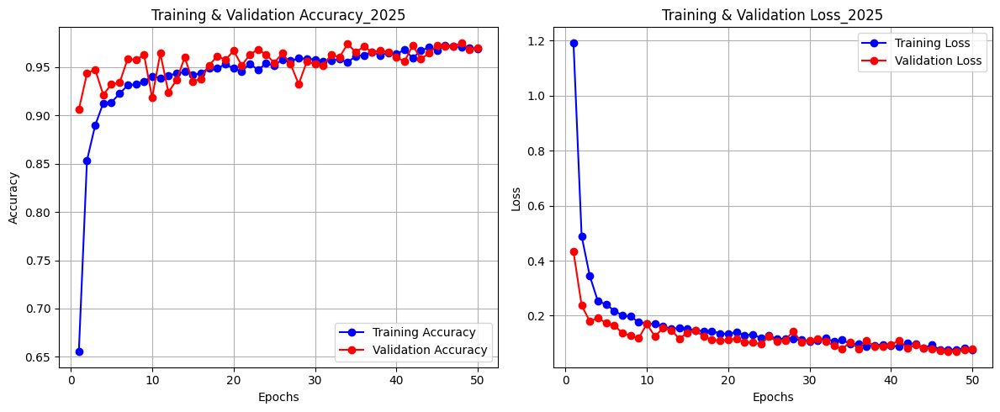

In [ ]:
import matplotlib.pyplot as plt

# استدعاء التاريخ
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# ===============================
# رسم الدقة Accuracy
# ===============================
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epochs, acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training & Validation Accuracy_2025')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# ===============================
# رسم الخسارة Loss
# ===============================
plt.subplot(1,2,2)
plt.plot(epochs, loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training & Validation Loss_2025')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
## Classification Report: After do the weighting classes: #0.95
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# 1️⃣ الحصول على التنبؤات
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# 2️⃣ تحويل أسماء الفئات إلى نصوص لتجنب خطأ len(np.int64)
target_names = [str(c) for c in encoder.classes_]

# 3️⃣ طباعة مصفوفة الالتباس
cm = confusion_matrix(y_true, y_pred)
print("Confusion Matrix_2025:\n", cm)

# 4️⃣ طباعة Classification Report
print("\nClass_Report_2025:\n", classification_report(y_true, y_pred, target_names=target_names))

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Confusion Matrix_2025:
 [[178   0   0   0   0   0   0]
 [  0 201   1   0   0   0   5]
 [  0   1 167   0   0   0  11]
 [  0   0   0 117   0   0   0]
 [  0   0   0   0  90   0   0]
 [  0   0   0   0   0  54   0]
 [  0   0  10   0   0   1  66]]

Class_Report_2025:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       178
           1       1.00      0.97      0.98       207
           2       0.94      0.93      0.94       179
           3       1.00      1.00      1.00       117
           4       1.00      1.00      1.00        90
           5       0.98      1.00      0.99        54
           6       0.80      0.86      0.83        77

    accuracy                           0.97       902
   macro avg       0.96      0.97      0.96       902
weighted avg       0.97      0.97      0.97       902



In [ ]:
model = keras.models.load_model('/content/drive/MyDrive/CNN_output/final_cnn/M_cnn_2025_new.keras')

/usr/local/lib/python3.12/dist-packages/earthpy/spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


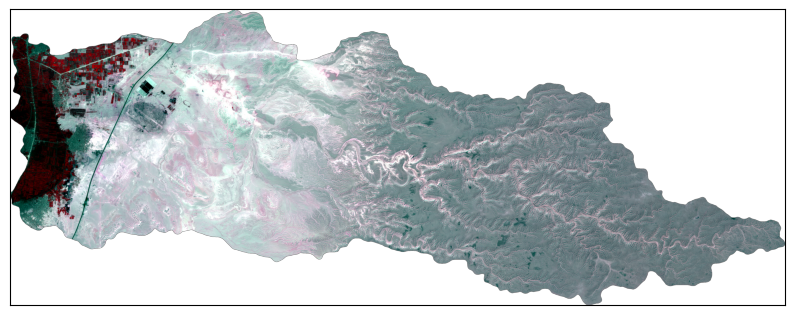

In [ ]:
import rasterio
import earthpy.plot as ep
import matplotlib.pyplot as plt

# فتح الصورة
img = rasterio.open("/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif")

# قراءة جميع الباندرز
full_img = img.read()  # شكل المصفوفة: (bands, rows, cols)

# افتراض أن RGB هو الباندرز 4,3,2 في Sentinel-2 (B4=Red, B3=Green, B2=Blue)
rgb = full_img[[3, 2, 1], :, :]  # لاحظ الأندكس يبدأ من 0

# رسم الصورة
ep.plot_rgb(rgb, figsize=(10, 10), stretch=True)
plt.show()

In [ ]:
# reshape to (height *width,band,1) to match the model's input: (num_pixels, bands, 1)
img_to_predict = full_img.transpose(1, 2, 0).reshape(-1, full_img.shape[0], 1)
print("Shape for prediction_2025:", img_to_predict.shape)

#predict
prediction_probs = model.predict(img_to_predict, batch_size=1024)
prediction = np.argmax(prediction_probs, axis=1)
print("Predicted classes shape_2025:", prediction.shape)

Shape for prediction_2025: (9838023, 10, 1)
9608/9608 ━━━━━━━━━━━━━━━━━━━━ 84s 9ms/step
Predicted classes shape_2025: (9838023,)


<Figure size 1000x1000 with 0 Axes>

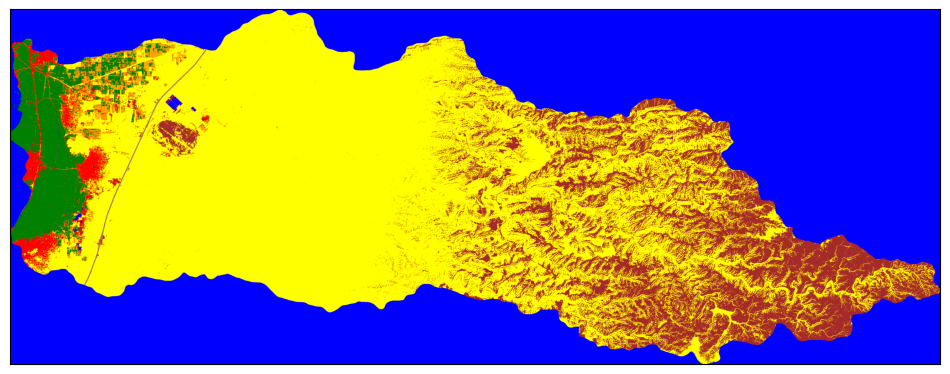

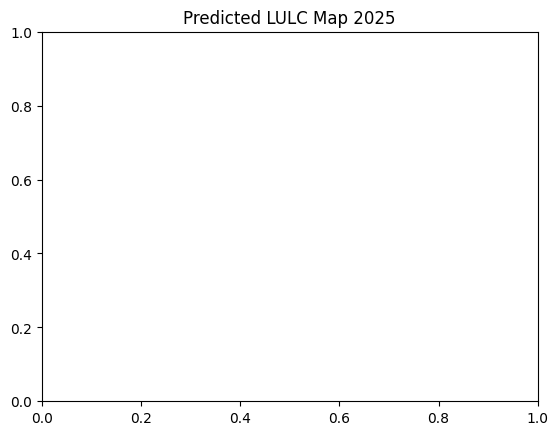

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import earthpy.plot as ep

# ===============================
# 1️⃣ reshape prediction لتكون صورة
# ===============================
prediction_img = prediction.reshape(full_img.shape[1], full_img.shape[2])

# ===============================
# 2️⃣ إعداد الألوان لكل فئة
# ===============================
# لنفترض عندك CLASSES.PALETTE = قائمة ألوان لكل class
# مثال:
palette = ['blue','green','red','yellow','gray','brown','orange']  # عدّل حسب الفئات عندك
num_classes = len(palette)

# إنشاء colormap و norm
cmap = mcolors.ListedColormap(palette[:num_classes])
bounds = list(range(num_classes+1))
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# ===============================
# 3️⃣ عرض الخريطة
# ===============================
plt.figure(figsize=(10,10))
ep.plot_bands(prediction_img, cmap=cmap, norm=norm, cbar=False)
plt.title("Predicted LULC Map 2025")
plt.show()

In [ ]:
prediction_probs = model.predict(
    img_to_predict,
    batch_size=1024,
    verbose=1
)

prediction = np.argmax(prediction_probs, axis=1)
print(prediction.shape)
# (1102*1896,)

9608/9608 ━━━━━━━━━━━━━━━━━━━━ 74s 8ms/step
(9838023,)


In [ ]:
# full_img: (bands, height, width)

bands, height, width = full_img.shape

# (height, width, bands)
img_reshaped = full_img.transpose(1, 2, 0)

# (height*width, bands, 1)
img_to_predict = img_reshaped.reshape(height * width, bands, 1)

print(img_to_predict.shape)
# (1102*1896, 10, 1)

(9838023, 10, 1)


In [ ]:
prediction_2d = prediction.reshape(height, width)

print(prediction_2d.shape)
# (1102, 1896)

(1937, 5079)


In [ ]:
import rasterio as rio

save_location = '/content/drive/MyDrive/CNN_output/final_cnn/1dcnn_lulc_2025_new_2.tif'

with rio.open(
    save_location,
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=1,
    dtype=prediction_2d.dtype,
    crs=img.crs,
    transform=img.transform
) as dst:
    dst.write(prediction_2d, 1)

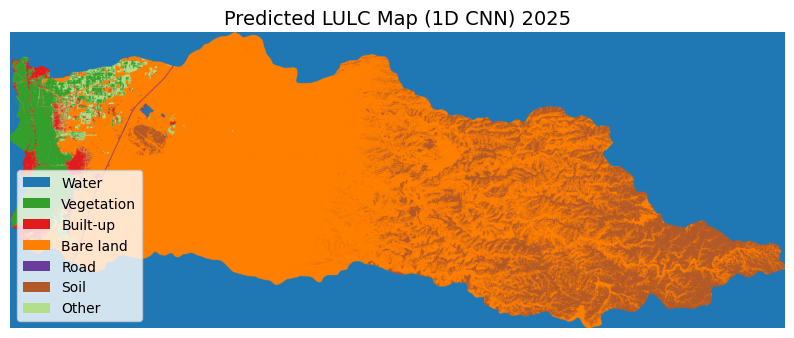

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import earthpy.plot as ep
import numpy as np

# ===============================
# 1️⃣ إعادة تشكيل التنبؤ
# ===============================
height, width = full_img.shape[1], full_img.shape[2]
prediction_img = prediction.reshape(height, width)

# ===============================
# 2️⃣ إعداد الألوان (حسب الفئات)
# ===============================
# عدّلي الألوان والأسماء حسب فئاتك الحقيقية
class_names = [
    'Water', 'Vegetation', 'Built-up',
    'Bare land', 'Road', 'Soil', 'Other'
]

palette = [
    '#1f78b4',  # Water
    '#33a02c',  # Vegetation
    '#e31a1c',  # Built-up
    '#ff7f00',  # Bare land
    '#6a3d9a',  # Road
    '#b15928',  # Soil
    '#b2df8a'   # Other
]

num_classes = len(class_names)

# Colormap + Norm (للتصنيفات المتقطعة)
cmap = mcolors.ListedColormap(palette)
bounds = np.arange(num_classes + 1)
norm = mcolors.BoundaryNorm(bounds, cmap.N)

# ===============================
# 3️⃣ عرض الخريطة
# ===============================
fig, ax = plt.subplots(figsize=(10, 10))

ep.plot_bands(
    prediction_img,
    ax=ax,
    cmap=cmap,
    norm=norm,
    cbar=False
)

ax.set_title("Predicted LULC Map (1D CNN) 2025", fontsize=14)
ax.axis('off')

# ===============================
# 4️⃣ إضافة Legend احترافي
# ===============================
from matplotlib.patches import Patch

legend_elements = [
    Patch(facecolor=palette[i], label=class_names[i])
    for i in range(num_classes)
]

ax.legend(
    handles=legend_elements,
    loc='lower left',
    fontsize=10,
    frameon=True
)

plt.show()

In [ ]:
import numpy as np
import rasterio
from rasterio.transform import from_bounds
from rasterio.crs import CRS

# ===============================
# 1️⃣ reshape prediction
# ===============================
prediction_img = prediction.reshape(full_img.shape[1], full_img.shape[2])

# ===============================
# 2️⃣ تحويل النوع إلى uint8 أو int16
# ===============================
prediction_img = prediction_img.astype(np.uint8)  # مهم جداً لـ ArcGIS

# ===============================
# 3️⃣ احصل على CRS و Transform من الصورة الأصلية
# ===============================
# افتح الصورة الأصلية لاستخراج المعلومات المكانية
with rasterio.open("/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif") as src:
    transform = src.transform
    crs = src.crs
    height = src.height
    width = src.width

# ===============================
# 4️⃣ احفظ الصورة بشكل صحيح
# ===============================
output_path = "/content/drive/MyDrive/CNN_output/final_cnn/CNN_2025.tif"

with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=prediction_img.shape[0],
    width=prediction_img.shape[1],
    count=1,                        # band واحد
    dtype=np.uint8,                 # نوع مدعوم في ArcGIS
    crs=crs,                        # نظام الإسناد المكاني
    transform=transform,            # الإحداثيات الجغرافية
    nodata=255                      # قيمة nodata
) as dst:
    dst.write(prediction_img, 1)

print(f"✅ تم الحفظ: {output_path}")

✅ تم الحفظ: /content/drive/MyDrive/CNN_output/final_cnn/CNN_2025.tif


In [ ]:
import numpy as np
import rasterio

# ===============================
# 1️⃣ عدّل هذا المسار للصورة الأصلية
# ===============================
original_image_path = "/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif"  # ← غيّر هذا

# ===============================
# 2️⃣ reshape prediction
# ===============================
prediction_img = prediction.reshape(full_img.shape[1], full_img.shape[2])
prediction_img = prediction_img.astype(np.uint8)

# ===============================
# 3️⃣ استخراج CRS و Transform من الصورة الأصلية
# ===============================
with rasterio.open(original_image_path) as src:
    transform = src.transform
    crs = src.crs
    print("✅ CRS:", crs)
    print("✅ Transform:", transform)

# ===============================
# 4️⃣ حفظ الصورة
# ===============================
output_path = "CNN_2025.tif"

with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=prediction_img.shape[0],
    width=prediction_img.shape[1],
    count=1,
    dtype=np.uint8,
    crs=crs,
    transform=transform,
    nodata=255
) as dst:
    dst.write(prediction_img, 1)

print(f"✅ تم الحفظ بنجاح: {output_path}")

✅ CRS: EPSG:32636
✅ Transform: | 10.00, 0.00, 328360.00|
| 0.00,-10.00, 3256670.00|
| 0.00, 0.00, 1.00|
✅ تم الحفظ بنجاح: CNN_2025.tif


In [ ]:
with rasterio.open(output_path) as src:
    print("CRS     :", src.crs)
    print("Transform:", src.transform)
    print("Dtype   :", src.dtypes)
    print("Shape   :", src.shape)
    print("Nodata  :", src.nodata)
    print("Min/Max :", src.read(1).min(), "/", src.read(1).max())

CRS     : EPSG:32636
Transform: | 10.00, 0.00, 328360.00|
| 0.00,-10.00, 3256670.00|
| 0.00, 0.00, 1.00|
Dtype   : ('uint8',)
Shape   : (1937, 5079)
Nodata  : 255.0
Min/Max : 0 / 6


In [ ]:
import rasterio

raster_path = "/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif"

with rasterio.open(raster_path) as src:
    crs = src.crs
    transform = src.transform
    bounds = src.bounds

print("CRS:", crs)
print("Affine Transform:", transform)
print("Bounds:", bounds)

CRS: EPSG:32636
Affine Transform: | 10.00, 0.00, 328360.00|
| 0.00,-10.00, 3256670.00|
| 0.00, 0.00, 1.00|
Bounds: BoundingBox(left=328360.0, bottom=3237300.0, right=379150.0, top=3256670.0)


In [ ]:
# أضف هذا عند الحفظ
with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=prediction_img.shape[0],
    width=prediction_img.shape[1],
    count=1,
    dtype=np.uint8,
    crs=crs,
    transform=transform,
    nodata=255,
    compress='lzw'       # ← ضغط يساعد ArcGIS
) as dst:
    dst.write(prediction_img, 1)
    # أضف Color Table
    colormap = {
        0: (0, 0, 255, 255),      # أزرق - ماء
        1: (0, 128, 0, 255),      # أخضر - غابة
        2: (255, 0, 0, 255),      # أحمر - مبانٍ
        3: (255, 255, 0, 255),    # أصفر - زراعة
        4: (128, 128, 128, 255),  # رمادي - صخر
        5: (139, 69, 19, 255),    # بني - تربة
        6: (255, 165, 0, 255),    # برتقالي - فئة 6
    }
    dst.write_colormap(1, colormap)

print("✅ تم الحفظ مع Color Table")

✅ تم الحفظ مع Color Table


In [ ]:
import os

output_path = "CNN_2025.tif"

# المسار الكامل
full_path = os.path.abspath(output_path)
print("📁 المسار الكامل:", full_path)

# المجلد الحالي
print("📂 المجلد الحالي:", os.getcwd())

📁 المسار الكامل: /content/CNN_2025.tif
📂 المجلد الحالي: /content


In [ ]:
import os
import shutil

# ===============================
# المسار المطلوب
# ===============================
output_dir = "/content/drive/MyDrive/CNN_output/final_cnn"
os.makedirs(output_dir, exist_ok=True)  # ينشئ المجلد إذا غير موجود

output_path = os.path.join(output_dir, "CNN_2025.tif")

# ===============================
# حفظ الصورة مباشرة في المسار
# ===============================
with rasterio.open(
    output_path,
    'w',
    driver='GTiff',
    height=prediction_img.shape[0],
    width=prediction_img.shape[1],
    count=1,
    dtype=np.uint8,
    crs=crs,
    transform=transform,
    nodata=255,
    compress='lzw'
) as dst:
    dst.write(prediction_img, 1)
    colormap = {
        0: (0, 0, 255, 255),
        1: (0, 128, 0, 255),
        2: (255, 0, 0, 255),
        3: (255, 255, 0, 255),
        4: (128, 128, 128, 255),
        5: (139, 69, 19, 255),
        6: (255, 165, 0, 255),
    }
    dst.write_colormap(1, colormap)

print(f"✅ تم الحفظ في: {output_path}")

✅ تم الحفظ في: /content/drive/MyDrive/CNN_output/final_cnn/CNN_2025.tif


/tmp/ipykernel_3378/3945489352.py:139: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_3378/3945489352.py:140: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  plt.savefig(
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


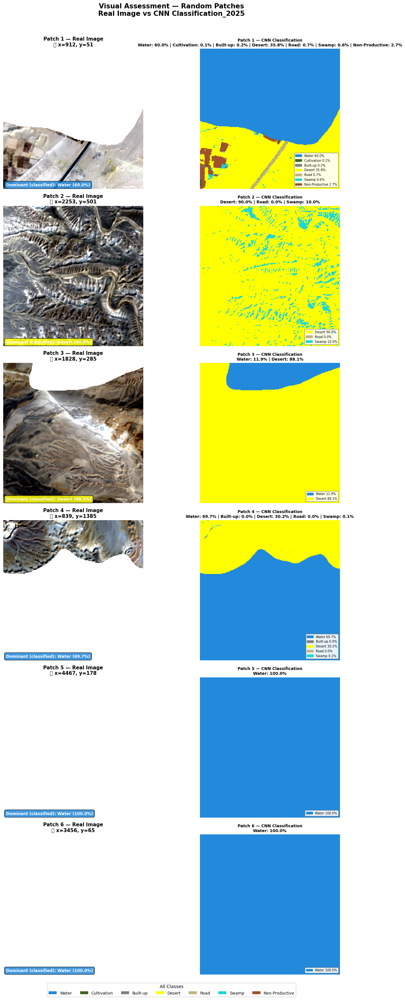

✅ تم حفظ التقييم البصري في Drive


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import random

# ===============================
# 1. تحميل الصورتين
# ===============================
feature_stack_path = '/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif'
classified_path    = '/content/drive/MyDrive/CNN_output/final_cnn/CNN_2025.tif'

with rasterio.open(feature_stack_path) as src:
    feature_data = src.read().astype(np.float32)

with rasterio.open(classified_path) as src:
    classified_data = src.read(1).astype(np.float32)

H, W = classified_data.shape
PATCH_SIZE = 256
NUM_PATCHES = 6

CLASS_NAMES  = ['Water','Cultivation','Built-up','Desert','Road','Swamp','Non-Productive']
CLASS_COLORS = ['#2389da','#416422','#808080','#FFFF00','#C2B280','#1fd6d5','#A0522D']
cmap = ListedColormap(CLASS_COLORS)

def normalize(band):
    p2, p98 = np.percentile(band[band > 0], (2, 98)) if band[band > 0].size > 0 else (0, 1)
    return np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)

def get_dominant_class(patch):
    unique, counts = np.unique(patch.astype(int), return_counts=True)
    dominant_idx = np.argmax(counts)
    dominant_class = unique[dominant_idx]
    percentage = counts[dominant_idx] / patch.size * 100
    return dominant_class, percentage

# ===============================
# 2. اختيار patches عشوائية
# ===============================
random.seed(42)
patches = []
for _ in range(NUM_PATCHES):
    x = random.randint(0, W - PATCH_SIZE)
    y = random.randint(0, H - PATCH_SIZE)
    patches.append((x, y))

# ===============================
# 3. الرسم
# ===============================
fig, axes = plt.subplots(NUM_PATCHES, 2, figsize=(14, NUM_PATCHES * 5))
fig.suptitle('Visual Assessment — Random Patches\nReal Image vs CNN Classification_2025',
             fontsize=15, fontweight='bold', y=1.01)

for i, (x, y) in enumerate(patches):

    # --- قص الـ patch ---
    rgb_patch = np.dstack([
        normalize(feature_data[0, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),  # B4
        normalize(feature_data[1, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),  # B3
        normalize(feature_data[2, y:y+PATCH_SIZE, x:x+PATCH_SIZE])   # B2
    ])
    cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

    # --- الظاهرة السائدة ---
    dom_class, dom_pct = get_dominant_class(cls_patch)
    dom_name  = CLASS_NAMES[int(dom_class)] if int(dom_class) < len(CLASS_NAMES) else 'Unknown'
    dom_color = CLASS_COLORS[int(dom_class)] if int(dom_class) < len(CLASS_COLORS) else 'gray'

    # --- توزيع كل الفئات في الـ patch ---
    unique, counts = np.unique(cls_patch.astype(int), return_counts=True)
    dist_text = ' | '.join([
        f'{CLASS_NAMES[c]}: {counts[j]/cls_patch.size*100:.1f}%'
        for j, c in enumerate(unique) if c < len(CLASS_NAMES)
    ])

    # ===============================
    # الصورة الحقيقية
    # ===============================
    axes[i, 0].imshow(rgb_patch)
    axes[i, 0].set_title(
        f'Patch {i+1} — Real Image\n📍 x={x}, y={y}',
        fontsize=11, fontweight='bold'
    )
    axes[i, 0].axis('off')

    # إضافة مربع الـ dominant class
    axes[i, 0].text(
        0.02, 0.02,
        f'Dominant (classified): {dom_name} ({dom_pct:.1f}%)',
        transform=axes[i, 0].transAxes,
        fontsize=9, color='white', fontweight='bold',
        bbox=dict(facecolor=dom_color, alpha=0.85, boxstyle='round,pad=0.4')
    )

    # ===============================
    # الصورة المصنفة
    # ===============================
    im = axes[i, 1].imshow(cls_patch, cmap=cmap, vmin=0, vmax=6,
                            interpolation='nearest')
    axes[i, 1].set_title(
        f'Patch {i+1} — CNN Classification\n{dist_text}',
        fontsize=9, fontweight='bold'
    )
    axes[i, 1].axis('off')

    # border بلون الـ dominant class
    for spine in axes[i, 1].spines.values():
        spine.set_edgecolor(dom_color)
        spine.set_linewidth(4)

    # Legend داخل الـ patch
    legend_patches = [
        mpatches.Patch(color=CLASS_COLORS[c], label=f'{CLASS_NAMES[c]} {counts[j]/cls_patch.size*100:.1f}%')
        for j, c in enumerate(unique) if c < len(CLASS_NAMES)
    ]
    axes[i, 1].legend(
        handles=legend_patches,
        loc='lower right', fontsize=7,
        framealpha=0.9, edgecolor='gray'
    )

# ===============================
# 4. Legend عام
# ===============================
legend_elements = [
    mpatches.Patch(facecolor=CLASS_COLORS[i], label=CLASS_NAMES[i])
    for i in range(len(CLASS_NAMES))
]
fig.legend(
    handles=legend_elements,
    loc='lower center', ncol=7,
    fontsize=9, framealpha=0.9,
    title='All Classes', title_fontsize=10,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout()
plt.savefig(
    '/content/drive/MyDrive/CNN_output/final_cnn/visual_assessment_patches_2025.png',
    dpi=150, bbox_inches='tight'
)
plt.show()
print('✅ تم حفظ التقييم البصري في Drive')

Image size    : 5079 x 1937
Eastern zone  : x → [2539 : 4523]  |  y → [300 : 1381]
  Patch → x=3366, y=1079
  Patch → x=2948, y=666
  Patch → x=3010, y=808
  Patch → x=2811, y=477
  Patch → x=3053, y=1084
  Patch → x=3626, y=483


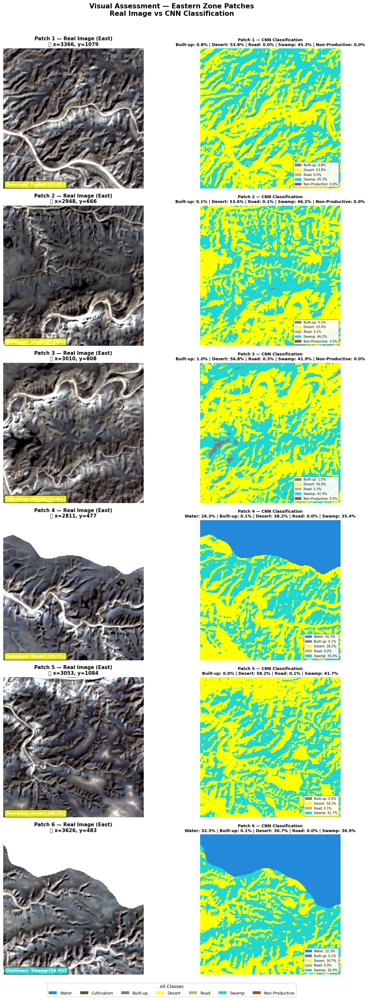

✅ تم حفظ التقييم البصري للجزء الشرقي في Drive


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import random

# ===============================
# 1. تحميل الصورتين
# ===============================
feature_stack_path = '/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2020_2.tif'
classified_path    = '/content/drive/MyDrive/CNN_output/final_cnn/CNN_2020.tif'

with rasterio.open(feature_stack_path) as src:
    feature_data = src.read().astype(np.float32)

with rasterio.open(classified_path) as src:
    classified_data = src.read(1).astype(np.float32)

H, W = classified_data.shape
PATCH_SIZE = 256
NUM_PATCHES = 6

# ===============================
# 2. تحديد الجزء الشرقي مع ابعاد عن الأطراف
# ===============================
MARGIN = 300  # ابعاد عن الأطراف

# الجزء الشرقي = النصف الأيمن من الصورة
x_min = W // 2          # بداية النصف الشرقي
x_max = W - MARGIN - PATCH_SIZE  # بعيد عن الطرف الأيمن
y_min = MARGIN           # بعيد عن الطرف العلوي
y_max = H - MARGIN - PATCH_SIZE  # بعيد عن الطرف السفلي

print(f'Image size    : {W} x {H}')
print(f'Eastern zone  : x → [{x_min} : {x_max}]  |  y → [{y_min} : {y_max}]')

CLASS_NAMES  = ['Water','Cultivation','Built-up','Desert','Road','Swamp','Non-Productive']
CLASS_COLORS = ['#2389da','#416422','#808080','#FFFF00','#C2B280','#1fd6d5','#A0522D']
cmap = ListedColormap(CLASS_COLORS)

def normalize(band):
    valid = band[band > 0]
    if valid.size == 0:
        return np.zeros_like(band)
    p2, p98 = np.percentile(valid, (2, 98))
    return np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)

def get_dominant_class(patch):
    unique, counts = np.unique(patch.astype(int), return_counts=True)
    dominant_idx   = np.argmax(counts)
    return unique[dominant_idx], counts[dominant_idx] / patch.size * 100

# ===============================
# 3. اختيار patches عشوائية من الجزء الشرقي
# ===============================
random.seed(99)
patches = []
for _ in range(NUM_PATCHES):
    x = random.randint(x_min, x_max)
    y = random.randint(y_min, y_max)
    patches.append((x, y))
    print(f'  Patch → x={x}, y={y}')

# ===============================
# 4. الرسم
# ===============================
fig, axes = plt.subplots(NUM_PATCHES, 2, figsize=(14, NUM_PATCHES * 5))
fig.suptitle('Visual Assessment — Eastern Zone Patches\nReal Image vs CNN Classification',
             fontsize=15, fontweight='bold', y=1.01)

for i, (x, y) in enumerate(patches):

    # --- قص الـ patch ---
    rgb_patch = np.dstack([
        normalize(feature_data[0, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),  # B4
        normalize(feature_data[1, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),  # B3
        normalize(feature_data[2, y:y+PATCH_SIZE, x:x+PATCH_SIZE])   # B2
    ])
    cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

    # --- الظاهرة السائدة ---
    dom_class, dom_pct = get_dominant_class(cls_patch)
    dom_name  = CLASS_NAMES[int(dom_class)] if int(dom_class) < len(CLASS_NAMES) else 'Unknown'
    dom_color = CLASS_COLORS[int(dom_class)] if int(dom_class) < len(CLASS_COLORS) else 'gray'

    # --- توزيع الفئات ---
    unique, counts = np.unique(cls_patch.astype(int), return_counts=True)
    dist_text = ' | '.join([
        f'{CLASS_NAMES[c]}: {counts[j]/cls_patch.size*100:.1f}%'
        for j, c in enumerate(unique) if c < len(CLASS_NAMES)
    ])

    # ===============================
    # الصورة الحقيقية
    # ===============================
    axes[i, 0].imshow(rgb_patch)
    axes[i, 0].set_title(
        f'Patch {i+1} — Real Image (East)\n📍 x={x}, y={y}',
        fontsize=11, fontweight='bold'
    )
    axes[i, 0].axis('off')
    axes[i, 0].text(
        0.02, 0.02,
        f'Dominant: {dom_name} ({dom_pct:.1f}%)',
        transform=axes[i, 0].transAxes,
        fontsize=9, color='white', fontweight='bold',
        bbox=dict(facecolor=dom_color, alpha=0.85, boxstyle='round,pad=0.4')
    )

    # ===============================
    # الصورة المصنفة
    # ===============================
    axes[i, 1].imshow(cls_patch, cmap=cmap, vmin=0, vmax=6, interpolation='nearest')
    axes[i, 1].set_title(
        f'Patch {i+1} — CNN Classification\n{dist_text}',
        fontsize=9, fontweight='bold'
    )
    axes[i, 1].axis('off')

    # border بلون الـ dominant class
    for spine in axes[i, 1].spines.values():
        spine.set_edgecolor(dom_color)
        spine.set_linewidth(4)

    # Legend داخل كل patch
    legend_patches = [
        mpatches.Patch(color=CLASS_COLORS[c],
                       label=f'{CLASS_NAMES[c]}: {counts[j]/cls_patch.size*100:.1f}%')
        for j, c in enumerate(unique) if c < len(CLASS_NAMES)
    ]
    axes[i, 1].legend(
        handles=legend_patches,
        loc='lower right', fontsize=7,
        framealpha=0.9, edgecolor='gray'
    )

# ===============================
# 5. Legend عام
# ===============================
legend_elements = [
    mpatches.Patch(facecolor=CLASS_COLORS[i], label=CLASS_NAMES[i])
    for i in range(len(CLASS_NAMES))
]
fig.legend(
    handles=legend_elements,
    loc='lower center', ncol=7,
    fontsize=9, framealpha=0.9,
    title='All Classes', title_fontsize=10,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout()
plt.savefig(
    '/content/drive/MyDrive/CNN_output/final_cnn/visual_assessment_east.png',
    dpi=150, bbox_inches='tight'
)
plt.show()
print('✅ تم حفظ التقييم البصري للجزء الشرقي في Drive')

Image size: 5079 x 1937

=== توزيع الفئات في الصورة كلها ===
  Water               : 43.08%
  Cultivation         : 3.25%
  Built-up            : 0.48%
  Desert              : 37.85%
  Road                : 0.07%
  Swamp               : 14.21%
  Non-Productive      : 1.06%

=== توزيع الفئات في الجزء الغربي ===
  Water               : 15.44%
  Cultivation         : 4.98%
  Built-up            : 0.40%
  Desert              : 73.20%
  Road                : 0.14%
  Swamp               : 3.35%
  Non-Productive      : 2.49%

Search zone: x → [200:2411]  y → [200:1609]

Patches collected per class:
  ✅ Water               : 5 patches
  ✅ Cultivation         : 5 patches
  ❌ Built-up            : 0 patches
  ✅ Desert              : 5 patches
  ❌ Road                : 0 patches
  ❌ Swamp               : 0 patches
  ✅ Non-Productive      : 5 patches


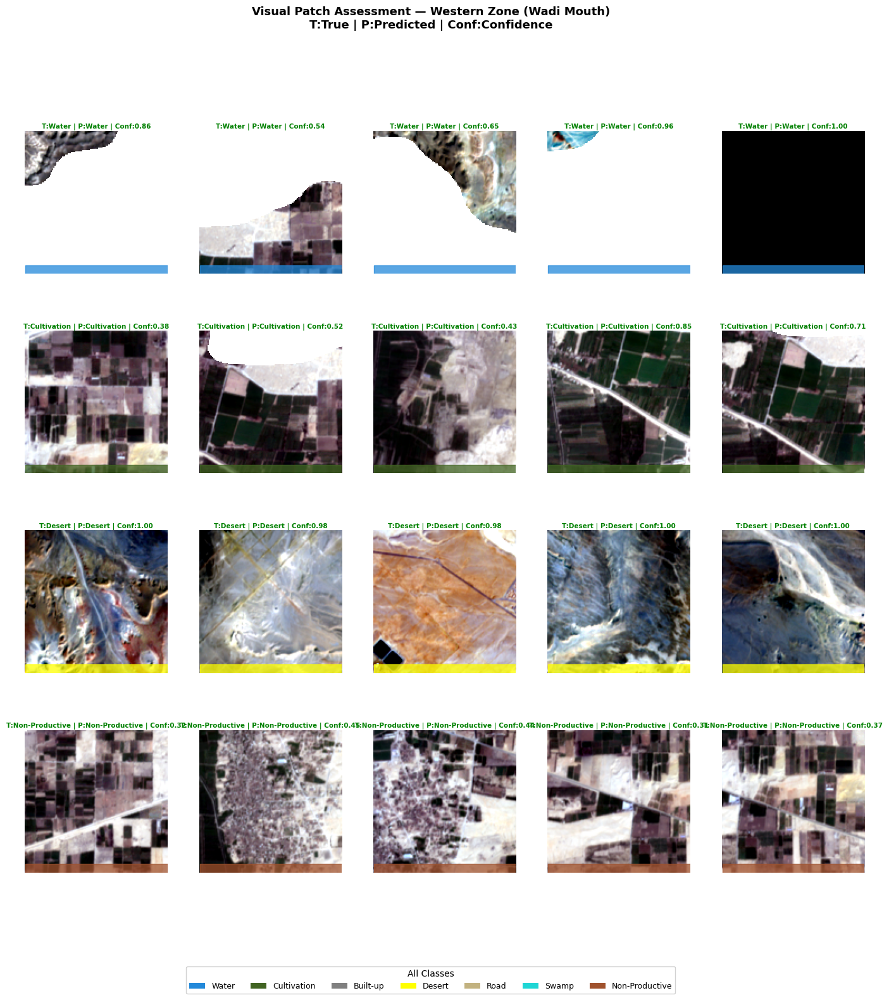

✅ تم الحفظ في Drive


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import random

# ===============================
# 1. تحميل الصورتين
# ===============================
feature_stack_path = '/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2020_2.tif'
classified_path    = '/content/drive/MyDrive/CNN_output/final_cnn/CNN_2020.tif'

with rasterio.open(feature_stack_path) as src:
    feature_data = src.read().astype(np.float32)

with rasterio.open(classified_path) as src:
    classified_data = src.read(1).astype(np.float32)

H, W = classified_data.shape
PATCH_SIZE        = 128
PATCHES_PER_CLASS = 5
MARGIN            = 200  # تقليل الـ margin

print(f'Image size: {W} x {H}')

# ===============================
# 2. فحص توزيع الفئات في الصورة كلها أولاً
# ===============================
unique_all, counts_all = np.unique(classified_data.astype(int), return_counts=True)
CLASS_NAMES  = ['Water','Cultivation','Built-up','Desert','Road','Swamp','Non-Productive']
CLASS_COLORS = ['#2389da','#416422','#808080','#FFFF00','#C2B280','#1fd6d5','#A0522D']
NUM_CLASSES  = len(CLASS_NAMES)

print('\n=== توزيع الفئات في الصورة كلها ===')
for c, cnt in zip(unique_all, counts_all):
    if c < NUM_CLASSES:
        pct = cnt / classified_data.size * 100
        print(f'  {CLASS_NAMES[c]:20s}: {pct:.2f}%')

# ===============================
# 3. فحص توزيع الفئات في الجزء الغربي فقط
# ===============================
# توسيع النطاق الغربي
x_min_w = MARGIN
x_max_w = int(W * 0.50)          # وسّعنا لـ 50% بدل 35%
y_min_w = MARGIN
y_max_w = H - MARGIN

west_zone = classified_data[y_min_w:y_max_w, x_min_w:x_max_w]
unique_w, counts_w = np.unique(west_zone.astype(int), return_counts=True)

print('\n=== توزيع الفئات في الجزء الغربي ===')
for c, cnt in zip(unique_w, counts_w):
    if c < NUM_CLASSES:
        pct = cnt / west_zone.size * 100
        print(f'  {CLASS_NAMES[c]:20s}: {pct:.2f}%')

# ===============================
# 4. تحديد المنطقة بناءً على الفئات الموجودة
# ===============================
# الغرب الكامل مع هامش بسيط
x_min = MARGIN
x_max = int(W * 0.50) - PATCH_SIZE
y_min = MARGIN
y_max = H - MARGIN - PATCH_SIZE

print(f'\nSearch zone: x → [{x_min}:{x_max}]  y → [{y_min}:{y_max}]')

def normalize(band):
    valid = band[band > 0]
    if valid.size == 0:
        return np.zeros_like(band)
    p2, p98 = np.percentile(valid, (2, 98))
    return np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)

def get_patch_info(cls_patch):
    unique, counts = np.unique(cls_patch.astype(int), return_counts=True)
    sorted_idx = np.argsort(-counts)
    dom_class  = int(unique[sorted_idx[0]])
    dom_conf   = counts[sorted_idx[0]] / cls_patch.size
    return dom_class, round(dom_conf, 2), unique, counts

# ===============================
# 5. جمع patches — threshold منخفض
# ===============================
random.seed(77)
class_patches = {i: [] for i in range(NUM_CLASSES)}

attempts = 0
while any(len(v) < PATCHES_PER_CLASS for v in class_patches.values()) and attempts < 200000:
    x = random.randint(x_min, x_max)
    y = random.randint(y_min, y_max)
    cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

    if cls_patch.shape != (PATCH_SIZE, PATCH_SIZE):
        attempts += 1
        continue

    dom_class, dom_conf, _, _ = get_patch_info(cls_patch)

    if (dom_class < NUM_CLASSES and
        dom_conf >= 0.30 and          # خفضنا الـ threshold لـ 30%
        len(class_patches[dom_class]) < PATCHES_PER_CLASS):
        class_patches[dom_class].append((x, y, dom_class, dom_conf))

    attempts += 1

print('\nPatches collected per class:')
for i, name in enumerate(CLASS_NAMES):
    found = len(class_patches[i])
    status = '✅' if found == PATCHES_PER_CLASS else ('⚠️' if found > 0 else '❌')
    print(f'  {status} {name:20s}: {found} patches')

# ===============================
# 6. الرسم
# ===============================
# الفئات اللي فيها patches فقط
active_classes = [i for i in range(NUM_CLASSES) if len(class_patches[i]) > 0]
n_rows = len(active_classes)

fig, axes = plt.subplots(
    n_rows, PATCHES_PER_CLASS,
    figsize=(PATCHES_PER_CLASS * 3.5, n_rows * 3.8),
    squeeze=False
)
fig.patch.set_facecolor('white')
plt.subplots_adjust(hspace=0.4, wspace=0.08)
fig.suptitle('Visual Patch Assessment — Western Zone (Wadi Mouth)\nT:True | P:Predicted | Conf:Confidence',
             fontsize=13, fontweight='bold', y=1.01)

for row, class_idx in enumerate(active_classes):
    patches_list = class_patches[class_idx]

    for col in range(PATCHES_PER_CLASS):
        ax = axes[row, col]

        if col >= len(patches_list):
            ax.axis('off')
            ax.text(0.5, 0.5, 'No patch\nfound',
                    ha='center', va='center',
                    fontsize=8, color='gray',
                    transform=ax.transAxes)
            continue

        x, y, dom_class, dom_conf = patches_list[col]

        rgb = np.dstack([
            normalize(feature_data[0, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),
            normalize(feature_data[1, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),
            normalize(feature_data[2, y:y+PATCH_SIZE, x:x+PATCH_SIZE])
        ])
        cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        dom_class, dom_conf, unique, counts = get_patch_info(cls_patch)

        pred_class  = int(unique[np.argsort(-counts)[0]])
        pred_name   = CLASS_NAMES[pred_class] if pred_class < NUM_CLASSES else 'Unknown'
        true_name   = CLASS_NAMES[class_idx]
        is_correct  = (pred_class == class_idx)
        title_color = 'green' if is_correct else 'red'

        ax.imshow(rgb)
        ax.axis('off')

        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(CLASS_COLORS[class_idx])
            spine.set_linewidth(3)

        ax.set_title(
            f'T:{true_name} | P:{pred_name} | Conf:{dom_conf:.2f}',
            fontsize=7.5, color=title_color,
            fontweight='bold', pad=3
        )

        ax.add_patch(plt.Rectangle(
            (0, PATCH_SIZE - 8), PATCH_SIZE, 8,
            transform=ax.transData,
            color=CLASS_COLORS[class_idx],
            alpha=0.75, clip_on=True
        ))

    axes[row, 0].set_ylabel(
        CLASS_NAMES[class_idx],
        fontsize=10, fontweight='bold',
        rotation=90, labelpad=8,
        color=CLASS_COLORS[class_idx]
    )

# Legend
legend_elements = [
    mpatches.Patch(facecolor=CLASS_COLORS[i], label=CLASS_NAMES[i])
    for i in range(NUM_CLASSES)
]
fig.legend(
    handles=legend_elements,
    loc='lower center', ncol=7,
    fontsize=9, framealpha=0.9,
    title='All Classes', title_fontsize=10,
    bbox_to_anchor=(0.5, -0.02)
)

plt.savefig(
    '/content/drive/MyDrive/CNN_output/final_cnn/patch_assessment_west_wadi.png',
    dpi=150, bbox_inches='tight', facecolor='white'
)
plt.show()
print('✅ تم الحفظ في Drive')

Active classes: ['Water', 'Cultivation', 'Built-up', 'Desert', 'Swamp', 'Non-Productive']


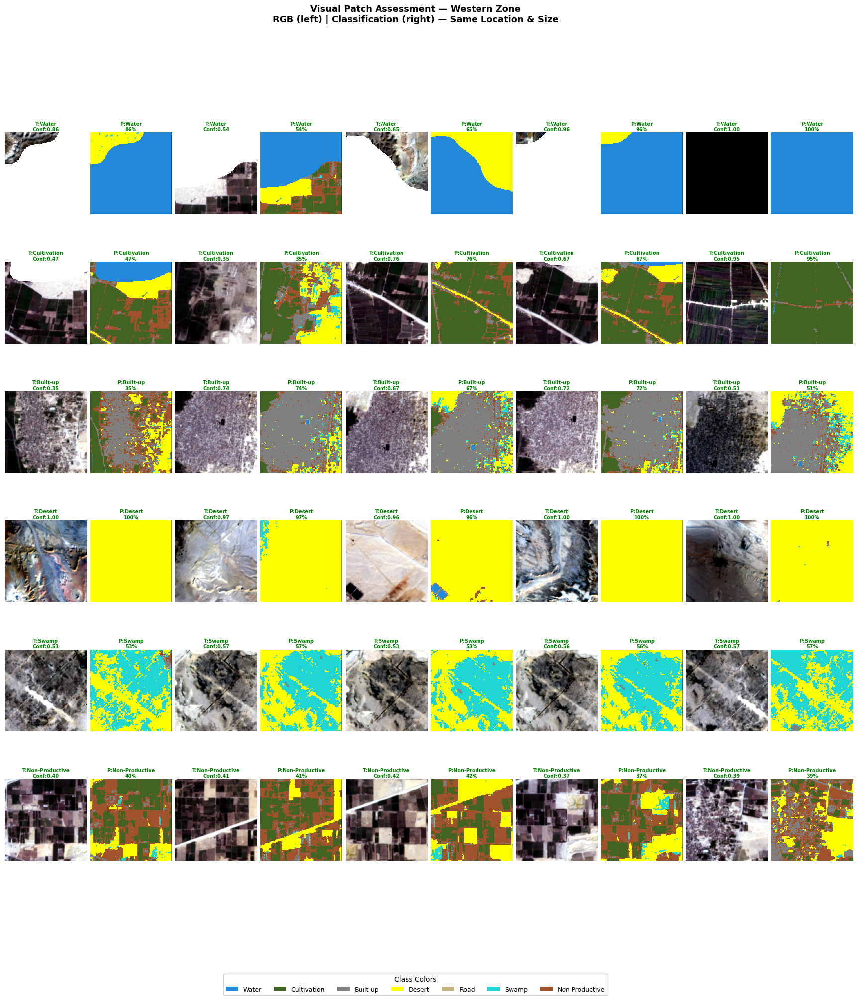

✅ تم الحفظ في Drive


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
import random

# ===============================
# 1. تحميل الصورتين
# ===============================
feature_stack_path = '/content/drive/MyDrive/DL/CNN_FeatureStack_10bands_2025_final.tif'
classified_path    = '/content/drive/MyDrive/CNN_output/final_cnn/CNN_2025.tif'

with rasterio.open(feature_stack_path) as src:
    feature_data = src.read().astype(np.float32)

with rasterio.open(classified_path) as src:
    classified_data = src.read(1).astype(np.float32)

H, W = classified_data.shape
PATCH_SIZE        = 128
PATCHES_PER_CLASS = 5
MARGIN            = 200

CLASS_NAMES  = ['Water','Cultivation','Built-up','Desert','Road','Swamp','Non-Productive']
CLASS_COLORS = ['#2389da','#416422','#808080','#FFFF00','#C2B280','#1fd6d5','#A0522D']
NUM_CLASSES  = len(CLASS_NAMES)
cmap         = ListedColormap(CLASS_COLORS)

# منطقة الغرب
x_min = MARGIN
x_max = int(W * 0.50) - PATCH_SIZE
y_min = MARGIN
y_max = H - MARGIN - PATCH_SIZE

def normalize(band):
    valid = band[band > 0]
    if valid.size == 0:
        return np.zeros_like(band)
    p2, p98 = np.percentile(valid, (2, 98))
    return np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)

def get_patch_info(cls_patch):
    unique, counts = np.unique(cls_patch.astype(int), return_counts=True)
    sorted_idx = np.argsort(-counts)
    dom_class  = int(unique[sorted_idx[0]])
    dom_conf   = counts[sorted_idx[0]] / cls_patch.size
    return dom_class, round(dom_conf, 2), unique, counts

# ===============================
# 2. جمع patches
# ===============================
random.seed(77)
class_patches = {i: [] for i in range(NUM_CLASSES)}

attempts = 0
while any(len(v) < PATCHES_PER_CLASS for v in class_patches.values()) and attempts < 300000:
    x = random.randint(x_min, x_max)
    y = random.randint(y_min, y_max)
    cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]

    if cls_patch.shape != (PATCH_SIZE, PATCH_SIZE):
        attempts += 1
        continue

    dom_class, dom_conf, _, _ = get_patch_info(cls_patch)

    if (dom_class < NUM_CLASSES and
        dom_conf >= 0.30 and
        len(class_patches[dom_class]) < PATCHES_PER_CLASS):
        class_patches[dom_class].append((x, y, dom_class, dom_conf))
    attempts += 1

# الفئات اللي فيها patches
active_classes = [i for i in range(NUM_CLASSES) if len(class_patches[i]) > 0]
print('Active classes:', [CLASS_NAMES[i] for i in active_classes])

# ===============================
# 3. الرسم — كل patch ليه عمودين (RGB | Classified)
# ===============================
n_rows = len(active_classes)
# كل فئة = صف، كل patch = عمودين (RGB + Classified)
total_cols = PATCHES_PER_CLASS * 2

fig, axes = plt.subplots(
    n_rows, total_cols,
    figsize=(total_cols * 2.2, n_rows * 3.2),
    squeeze=False
)
fig.patch.set_facecolor('white')
plt.subplots_adjust(hspace=0.45, wspace=0.04)

fig.suptitle('Visual Patch Assessment — Western Zone\n'
             'RGB (left) | Classification (right) — Same Location & Size',
             fontsize=13, fontweight='bold', y=1.01)

# عناوين الأعمدة
for p in range(PATCHES_PER_CLASS):
    col_rgb = p * 2
    col_cls = p * 2 + 1
    axes[0, col_rgb].set_title(f'Patch {p+1}\nRGB', fontsize=8,
                                fontweight='bold', color='gray', pad=4)
    axes[0, col_cls].set_title(f'Patch {p+1}\nClassified', fontsize=8,
                                fontweight='bold', color='gray', pad=4)

for row, class_idx in enumerate(active_classes):
    patches_list = class_patches[class_idx]

    # اسم الفئة على يسار كل صف
    axes[row, 0].set_ylabel(
        CLASS_NAMES[class_idx],
        fontsize=10, fontweight='bold',
        rotation=90, labelpad=8,
        color=CLASS_COLORS[class_idx]
    )

    for col in range(PATCHES_PER_CLASS):
        col_rgb = col * 2
        col_cls = col * 2 + 1

        ax_rgb = axes[row, col_rgb]
        ax_cls = axes[row, col_cls]

        if col >= len(patches_list):
            ax_rgb.axis('off')
            ax_cls.axis('off')
            ax_rgb.text(0.5, 0.5, 'N/A', ha='center', va='center',
                        fontsize=8, color='gray', transform=ax_rgb.transAxes)
            continue

        x, y, dom_class, dom_conf = patches_list[col]

        # ── RGB patch ──
        rgb = np.dstack([
            normalize(feature_data[0, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),
            normalize(feature_data[1, y:y+PATCH_SIZE, x:x+PATCH_SIZE]),
            normalize(feature_data[2, y:y+PATCH_SIZE, x:x+PATCH_SIZE])
        ])

        # ── Classified patch ──
        cls_patch = classified_data[y:y+PATCH_SIZE, x:x+PATCH_SIZE]
        dom_class, dom_conf, unique, counts = get_patch_info(cls_patch)

        pred_name   = CLASS_NAMES[dom_class] if dom_class < NUM_CLASSES else 'Unknown'
        true_name   = CLASS_NAMES[class_idx]
        is_correct  = (dom_class == class_idx)
        title_color = 'green' if is_correct else 'red'

        # ── عرض RGB ──
        ax_rgb.imshow(rgb)
        ax_rgb.axis('off')
        ax_rgb.set_title(
            f'T:{true_name}\nConf:{dom_conf:.2f}',
            fontsize=7, color=title_color,
            fontweight='bold', pad=2
        )

        # إطار RGB
        for spine in ax_rgb.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(CLASS_COLORS[class_idx])
            spine.set_linewidth(2.5)

        # ── عرض Classified ──
        ax_cls.imshow(cls_patch, cmap=cmap, vmin=0, vmax=6,
                      interpolation='nearest')
        ax_cls.axis('off')
        ax_cls.set_title(
            f'P:{pred_name}\n{dom_conf*100:.0f}%',
            fontsize=7, color=title_color,
            fontweight='bold', pad=2
        )

        # إطار Classified
        for spine in ax_cls.spines.values():
            spine.set_visible(True)
            spine.set_edgecolor(CLASS_COLORS[class_idx])
            spine.set_linewidth(2.5)

        # خط رفيع يفصل كل patch عن التالية
        if col < PATCHES_PER_CLASS - 1:
            ax_cls.axvline(x=PATCH_SIZE - 1, color='black',
                           linewidth=1.5, alpha=0.4)

# ===============================
# 4. Legend عام
# ===============================
legend_elements = [
    mpatches.Patch(facecolor=CLASS_COLORS[i], label=CLASS_NAMES[i])
    for i in range(NUM_CLASSES)
]
fig.legend(
    handles=legend_elements,
    loc='lower center', ncol=7,
    fontsize=9, framealpha=0.9,
    title='Class Colors', title_fontsize=10,
    bbox_to_anchor=(0.5, -0.03)
)

plt.savefig(
    '/content/drive/MyDrive/CNN_output/final_cnn/patch_assessment_2025.png',
    dpi=150, bbox_inches='tight', facecolor='white'
)
plt.show()
print('✅ تم الحفظ في Drive')